# Monte Carlo Simulation anhand Copulas

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import copulas
from copulas.multivariate import GaussianMultivariate
from scipy.stats import rv_continuous, rv_histogram, norm, beta, multivariate_normal,invgamma, chi2, t
from scipy import stats
import numpy_financial as npf

# Inputparameter

In [76]:
dof=3

In [3]:
menge=np.array([2325,2350,2375,2400,2425,2450,2475]) # Werte der Mengen
prob_menge=np.array([0.05,0.125,0.225,0.25,0.225,0.1,0.025]) # Wahrscheinlichkeiten der Mengen
preis=np.array([230,220,210,200,190,180]) # Werte der Preisen
prob_preis=np.array([0.05,0.125,0.225,0.3,0.225,0.075]) # Wahrscheinlichkeiten der Preisen
var_costs=np.array([80,90,100,110,120]) # Werte der variablen Kosten
prob_var_costs=np.array([0.1,0.225,0.4,0.175,0.1]) # Wahrscheinlichkeiten der variablen Kosten
fix_costs=np.array([50000,55000,60000,65000,70000]) # Werte der fixen Kosten
prob_fix_costs=np.array([0.1,0.275,0.3,0.175,0.15]) # Wahrscheinlichkeiten der fixen Kosten

In [4]:
N=30000

In [5]:
r=-0.7

# Parameter Berechnung der Eingangsvariablen

In [6]:
mean_m=np.mean(menge) # Der Durchschnittswert der Mengen
mean_p=np.mean(preis) # Der Durchschnittswert der Preis
mean_var_costs=np.mean(var_costs) # Der Durchschnittswert der variablen Kosten
mean_const_costs=np.mean(fix_costs) # Der Durchschnittswert der fixen Kosten
std_m=np.std(menge) # Standardabweichung der Mengen
std_p=np.std(preis) # Standardabweichung der Preise
std_var_costs=np.std(var_costs) # Standardabweichung der variablen Kosten
std_const_costs=np.std(fix_costs) # Standardabweichung der fixen Kosten

In [7]:
cust_preis = stats.rv_discrete(name='custm', values=(preis, prob_preis)) # Erstellen einer diskreten Verteilungsklasse für den Preis
cust_menge = stats.rv_discrete(name='custm', values=(menge, prob_menge)) # Erstellen einer diskreten Verteilungsklasse für die Mengen
cust_var_costs = stats.rv_discrete(name='custm', values=(var_costs, prob_var_costs)) # Erstellen einer diskreten Verteilungsklasse für variablen Kosten
cust_fix_costs = stats.rv_discrete(name='custm', values=(fix_costs, prob_fix_costs)) # Erstellen einer diskreten Verteilungsklasse für fixen Kosten

In [8]:
sampl_preis=cust_preis.rvs(size=N) # Stichproben aus einer diskreten Verteilung für den Preis
sampl_menge=cust_menge.rvs(size=N) # Stichproben aus einer diskreten Verteilung für die Mengen
sampl_var_costs=cust_var_costs.rvs(size=N) # Stichproben aus einer diskreten Verteilung für variable Kosten
sampl_fix_costs=cust_fix_costs.rvs(size=N) # Stichproben aus einer diskreten Verteilung für fixe Kosten


In [9]:
preis_param=stats.pearson3.fit(sampl_preis) # Ermittlung der Preisverteilungsparameter mit der MLE-Methode
menge_param=stats.beta.fit(sampl_menge) # Ermittlung der Mengenverteilungsparameter mit der MLE-Methode
var_costs_param=stats.burr.fit(sampl_var_costs) # Ermittlung der Verteilungsparameter mit der MLE-Methode für variable Kosten
fix_costs_param=stats.pearson3.fit(sampl_fix_costs) # Ermittlung der Verteilungsparameter mit der MLE-Methode für fixe Kosten

# Funktion zum Abbilden der gemeinsamen Verteilung

In [10]:
def cop(var_1, var_2, name_1, name_2):
    min_1=var_1.min() # Mindestwert der ersten Stichprobe
    max_1=var_1.max() # Maximumwert der ersten Stichprobe
    min_2=var_2.min() # Mindestwert der zweiten Stichprobe
    max_2=var_2.max() # Maximumwert der zweiten Stichprobe
    h = sns.jointplot(var_1, var_2, kind='kde', xlim=(min_1, max_1), ylim=(min_2, max_2), stat_func=None, cbar=True,cmap='plasma') # Funktion zum Zeichnen einer gemeinsamen Verteilung
    h.set_axis_labels(name_1, name_2, fontsize=16) # Achsenbezeichnungen
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.1) # Anpassen der Parameter für das Subplot-Layout
    pos_joint_ax = h.ax_joint.get_position() # Gemeinsame Verteilungsposition ermitteln
    pos_marg_x_ax = h.ax_marg_x.get_position() #Verteilungsposition der Randverteilung x ermitteln
    h.ax_joint.set_position([pos_joint_ax.x0, pos_joint_ax.y0, pos_marg_x_ax.width, pos_joint_ax.height]) # Gemeinsame Verteilung verschieben, um die gleiche Breite zu erhalten
    h.fig.axes[-1].set_position([.83, pos_joint_ax.y0, .07, pos_joint_ax.height]) # Ausrichtung der Farbskala

In [25]:
def histogram(var, name):
    hist = np.histogram(var, bins=100)
    histdist = rv_histogram(hist)
    X = np.linspace(var.min(), var.max(), 100)
    plt.title(name)
    plt.hist(var, density=True, bins=100)
    plt.plot(X, histdist.pdf(X), label="pdf")
    plt.show()

# Gaussian  Copula

In [11]:
c_target = np.array(    [[  1.0, r],
                        [  r,  1.0, ]]) # Covarienzmatrix

In [12]:
mvnorm =  stats.multivariate_normal(mean=[0,0],cov=c_target) # Erstellen einer Klasse gemeinsamer Gaußverteilungen mit einer bestimmten Kovarianzmatrix

In [13]:
x = mvnorm.rvs(N) # Stichproben aus einer gemeinsamen Gaußschen Standardverteilung

In [14]:
norm = stats.norm() # Initialisierung einer Normalverteilung
x_unif = norm.cdf(x) # Umwandlung von Normalverteilungen in Gleichverteilungen mittels der Comulative Distribution Function

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


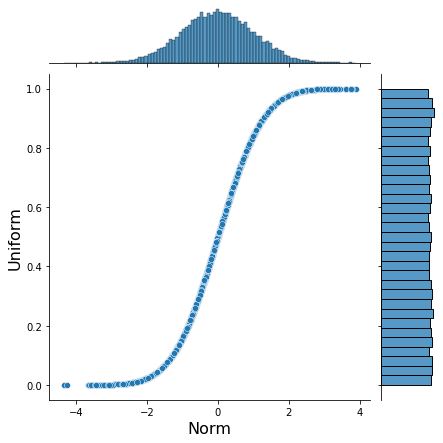

In [16]:
h = sns.jointplot(x[:, 0], x_unif[:, 0])
h.set_axis_labels('Norm', 'Uniform', fontsize=16)

In [17]:
preis_rand = stats.pearson3(*preis_param).ppf(x_unif[:, 1]) # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion

In [18]:
menge_rand=stats.beta(*menge_param).ppf(x_unif[:, 0]) #Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


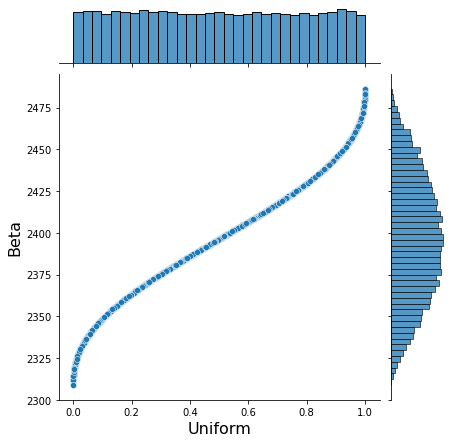

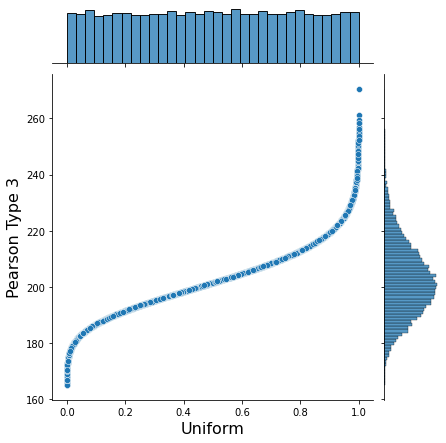

In [19]:
h = sns.jointplot( x_unif[:, 0],menge_rand)
h.set_axis_labels('Uniform', 'Beta', fontsize=16)
h = sns.jointplot( x_unif[:, 1],preis_rand)
h.set_axis_labels('Uniform', 'Pearson Type 3', fontsize=16)

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(


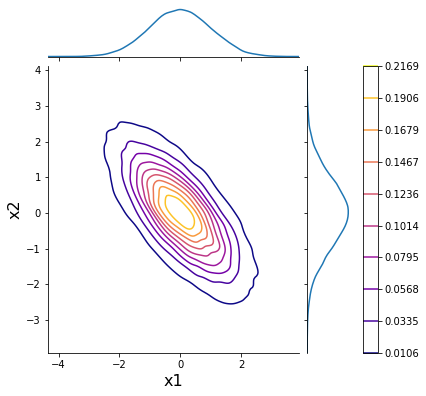

In [20]:
cop(x[:, 0], x[:, 1], 'x1', 'x2')


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(


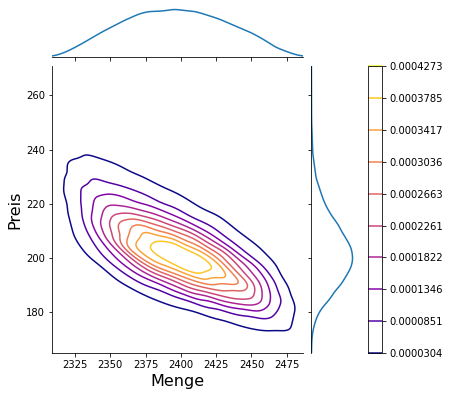

In [21]:
cop(menge_rand, preis_rand, 'Menge', 'Preis')

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


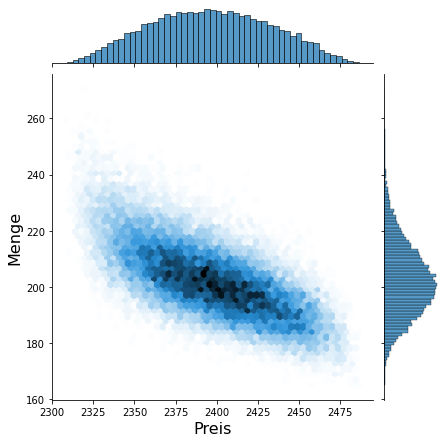

In [30]:
h = sns.jointplot(menge_rand, preis_rand, kind='hex')
h.set_axis_labels('Preis', 'Menge', fontsize=16);
plt.show()

In [24]:
I=-500              #Investition
rate=0.12            # Discount rate
years=5             # Projektlaufzeit
menge = menge_rand                           # menge
preis = preis_rand                          # preis
var_dist = stats.burr(*var_costs_param)
fix_dist = stats.pearson3(*fix_costs_param)
rand_var_costs=var_dist.rvs(N) 
rand_const_costs=fix_dist.rvs(N) 
var=rand_var_costs/1000                   # variable Kosten
fix=rand_const_costs/1000            # fixe Kosten
costs=var*menge+fix                 # gemeinsame Kosten
Rev = menge * preis/1000                      #Umsatz
R=Rev-costs                           #Cash Flow
discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy_financial\_financial.py:780: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.asarray(values)


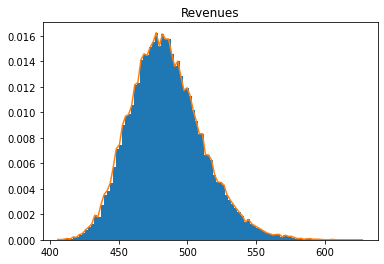

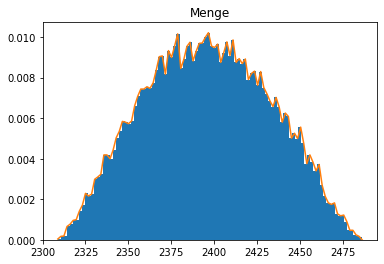

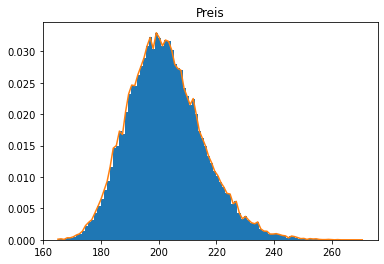

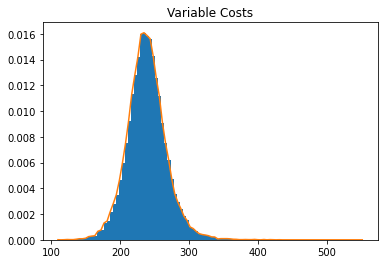

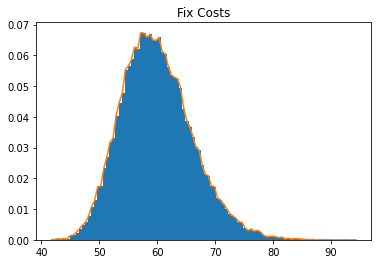

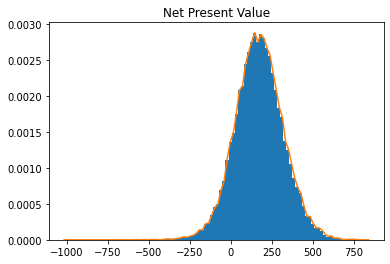

In [29]:
histogram(Rev, "Revenues")
histogram(menge, "Menge")
histogram(preis, "Preis")
histogram(var*menge, "Variable Costs")
histogram(fix, "Fix Costs")
histogram(discount_cashflow, "Net Present Value")

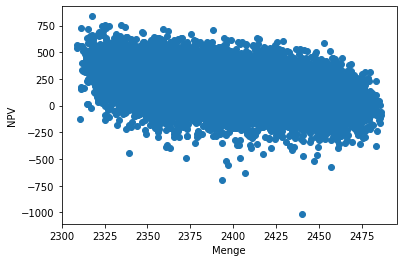

In [40]:
plt.scatter(menge,discount_cashflow)
plt.xlabel("Menge")
plt.ylabel("NPV")
plt.show()

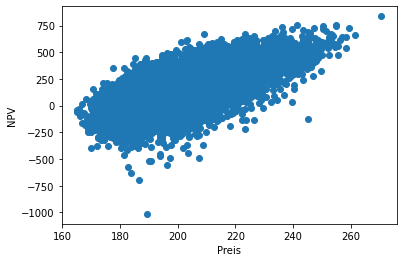

In [41]:
plt.scatter(preis,discount_cashflow)
plt.xlabel("Preis")
plt.ylabel("NPV")
plt.show()

In [42]:
df_npv_student=pd.DataFrame(discount_cashflow)

In [43]:
df_npv_student.describe()

,0
count,30000.000000
mean,170.637623
std,145.600137
min,-1014.811342
25%,75.850273
50%,169.391840
75%,264.433458
max,838.003178


In [45]:
conf=0.95 # Confidence Level

In [46]:
np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)])

array([-111.66466144,  463.21611049])

# Student's Copula

In [77]:
t_multi=stats.multivariate_t(loc=[0,0], shape=c_target, df=dof) # Erstellen einer Klasse gemeinsamer Student's mit einer bestimmten Kovarianzmatrix und Freiheitsgrades

In [78]:
X_t=t_multi.rvs(N) # Stichproben aus einer gemeinsamen Student's Standardverteilung

In [79]:
U = t.cdf(X_t,dof) # Umwandlung von Student's in Gleichverteilungen mittels der Comulative Distribution Function

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


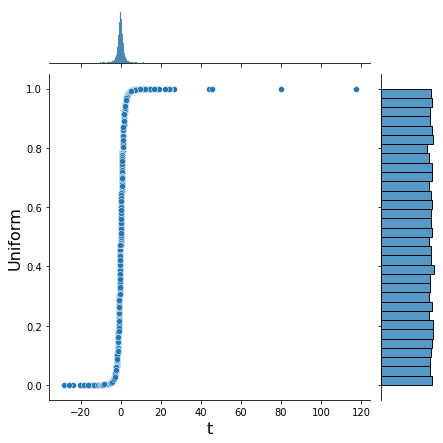

In [80]:
h = sns.jointplot(X_t[:, 1], U[:, 1])
h.set_axis_labels('t', 'Uniform', fontsize=16)

In [81]:
u_menge=stats.beta(*menge_param).ppf(U[:, 0])  # Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion
u_preis=stats.pearson3(*preis_param).ppf(U[:, 1])  # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(


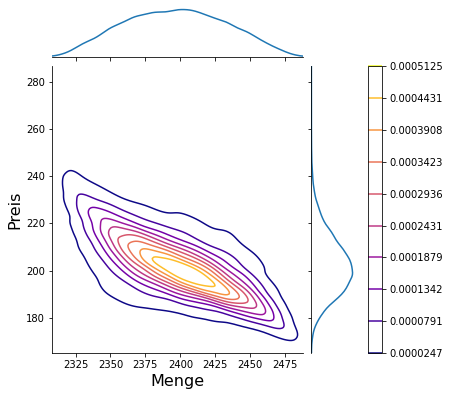

In [82]:
cop(u_menge, u_preis, 'Menge', 'Preis')

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


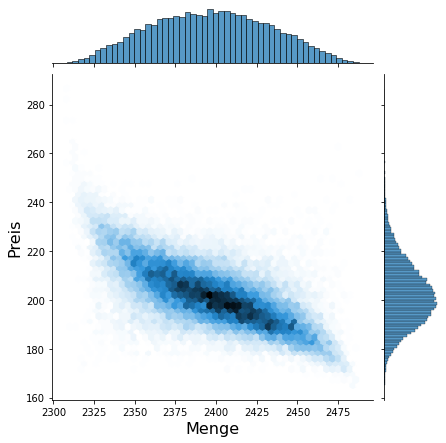

In [83]:
h = sns.jointplot(u_menge, u_preis, kind='hex')
h.set_axis_labels('Menge', 'Preis', fontsize=16);
plt.show()

In [84]:
I=-500              #Investition
rate=0.12            # Discount rate
years=5             # Projektlaufzeit
menge = u_menge                           # menge
preis = u_preis                          # preis
var_dist = stats.burr(*var_costs_param)
fix_dist = stats.pearson3(*fix_costs_param)
rand_var_costs=var_dist.rvs(N) 
rand_const_costs=fix_dist.rvs(N) 
var=rand_var_costs/1000                   # variable Kosten
fix=rand_const_costs/1000            # fixe Kosten
costs=var*menge+fix                 # gemeinsame Kosten
Rev = menge * preis/1000                      #Umsatz
R=Rev-costs                           #Cash Flow
discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy_financial\_financial.py:780: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.asarray(values)


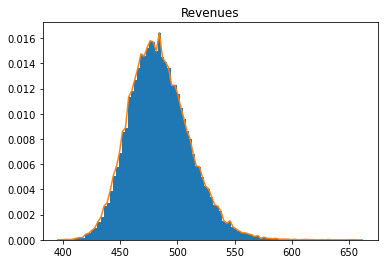

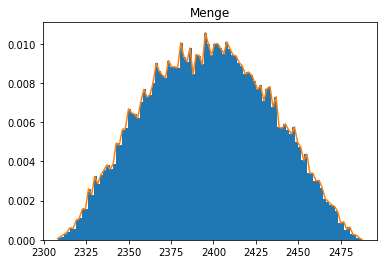

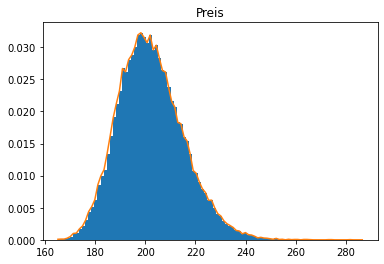

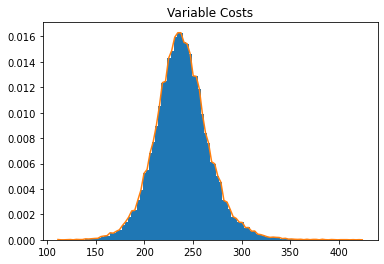

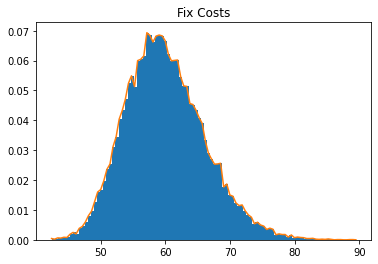

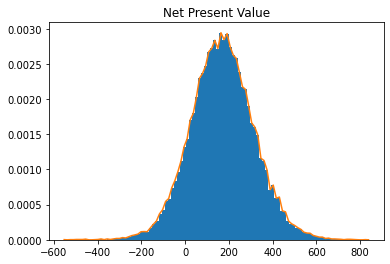

In [85]:
histogram(Rev, "Revenues")
histogram(menge, "Menge")
histogram(preis, "Preis")
histogram(var*menge, "Variable Costs")
histogram(fix, "Fix Costs")
histogram(discount_cashflow, "Net Present Value")

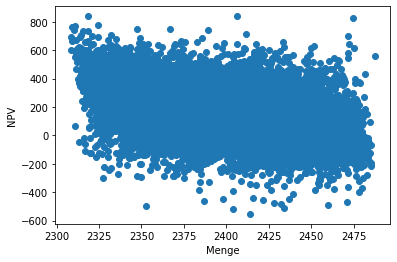

In [86]:
plt.scatter(menge,discount_cashflow)
plt.xlabel("Menge")
plt.ylabel("NPV")
plt.show()

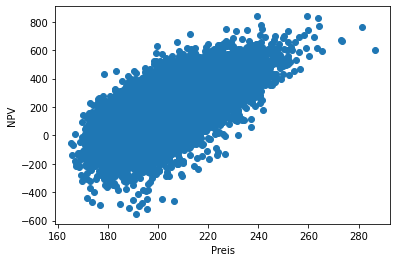

In [87]:
plt.scatter(preis,discount_cashflow)
plt.xlabel("Preis")
plt.ylabel("NPV")
plt.show()

In [88]:
df_npv_student=pd.DataFrame(discount_cashflow)

In [91]:
df_npv_student.describe()

,0
count,30000.000000
mean,170.287760
std,143.797950
min,-552.939361
25%,75.712234
50%,168.731511
75%,263.519152
max,839.089539


In [92]:
np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)])

array([-107.55175255,  456.95564198])

# Analysis of NPV for different correlations Gaussian Copula

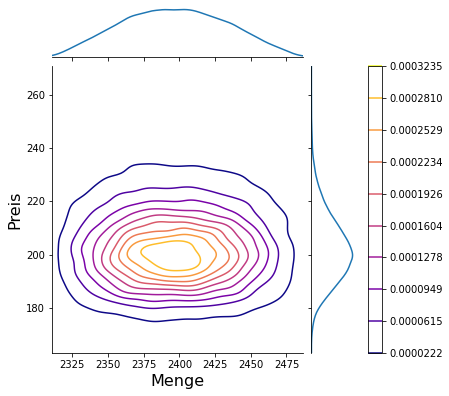

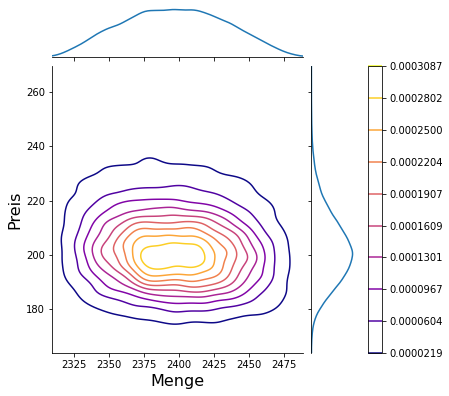

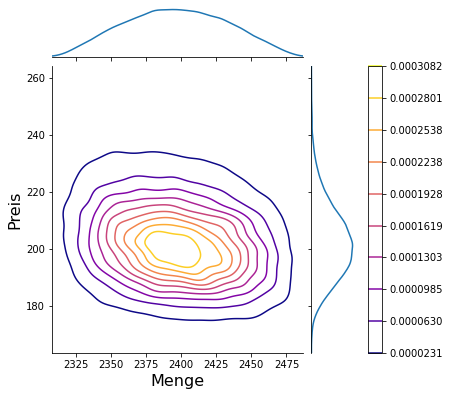

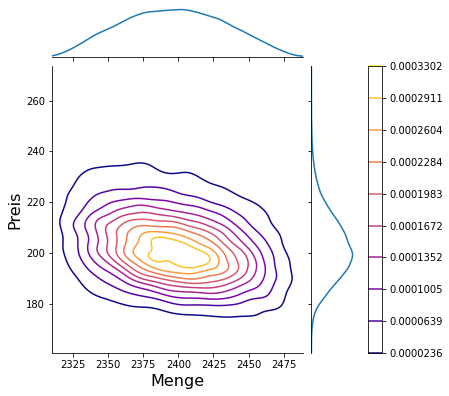

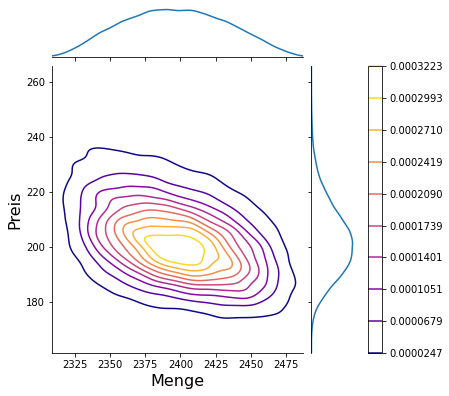

...

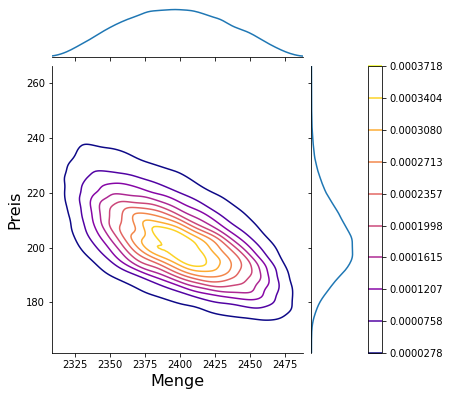

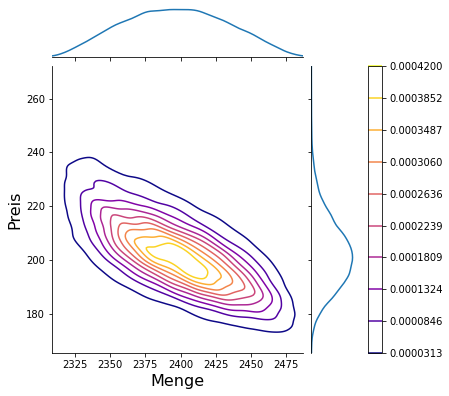

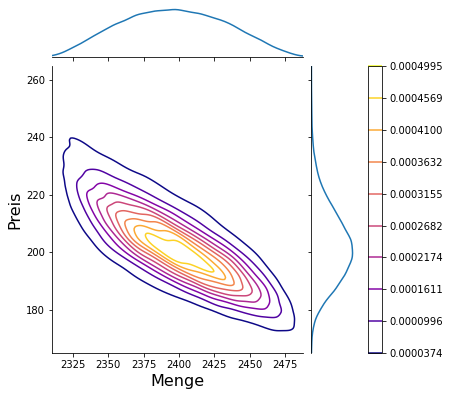

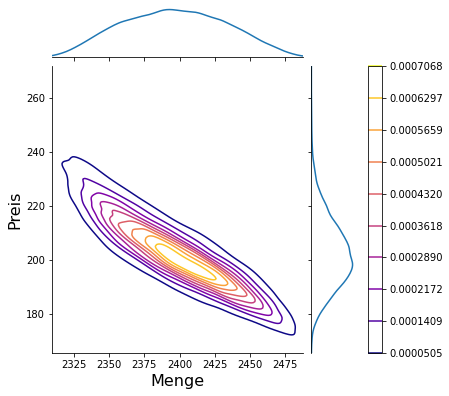

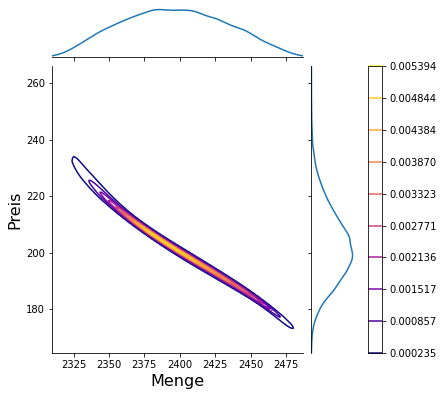

In [157]:
r=[0.001,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.999] # Korrelationskoeffizent
# Blätter zur Speicherung der Ergebnisse von Durchschnittswerten und Standardabweichungen
mean_npv_gaus=[]
std_npv_gaus=[]
mean_rev_gaus=[]
std_rev_gaus=[]
confi_npv=[]
# Zyklus 
for i in r:
    c_target = np.array(    [[  1.0, -i],
                        [  -i,  1.0, ]]) # Covarienzmatrix
    mvnorm =  stats.multivariate_normal(mean=[0,0],cov=c_target) # Erstellen einer Klasse gemeinsamer Gaußverteilungen mit einer bestimmten Kovarianzmatrix
    x = mvnorm.rvs(N) # Probenahme
    norm = stats.norm() # Initialisierung einer Normalverteilung
    x_unif = norm.cdf(x) # Umwandlung von Normalverteilungen in Gleichverteilungen mittels der Comulative Distribution Function
    preis_rand = stats.pearson3(*preis_param).ppf(x_unif[:, 1]) # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion
    menge_rand=stats.beta(*menge_param).ppf(x_unif[:, 0]) # Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion 
    # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = menge_rand                           # menge
    preis = preis_rand                          # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      #Umsatz
    R=Rev-costs                           #Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    cop(menge_rand, preis_rand, 'Menge', 'Preis')
    mean_npv_gaus.append(np.mean(discount_cashflow))
    std_npv_gaus.append(np.std(discount_cashflow))
    mean_rev_gaus.append(np.mean(Rev))
    std_rev_gaus.append(np.std(Rev))
    confi_npv.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    discount_cashflow_df=pd.DataFrame(discount_cashflow)

In [158]:
confi_npv # Veränderung des Konfidenzintervalls

[array([-120.5713343,  474.7168133]),
 array([-120.63799549,  475.03218245]),
 array([-113.72082208,  473.03429387]),
 array([-113.73820852,  469.25472787]),
 array([-113.55707243,  467.71972194]),
 array([-108.84756475,  464.16763506]),
 array([-106.09774866,  459.90509448]),
 array([-109.75130956,  459.60084887]),
 array([-110.80418285,  454.71602845]),
 array([-108.04432705,  453.43306841]),
 array([-107.20427386,  450.79971687])]

In [159]:
confi_npv_1,confi_npv_2=zip(*confi_npv)

Text(0, 0.5, 'Average')

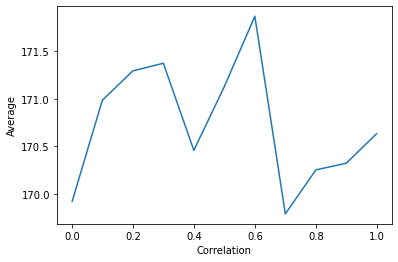

In [160]:
plt.plot(r,mean_npv_gaus)
plt.xlabel("Correlation")
plt.ylabel("Average")

Text(0, 0.5, 'Standart Deviation')

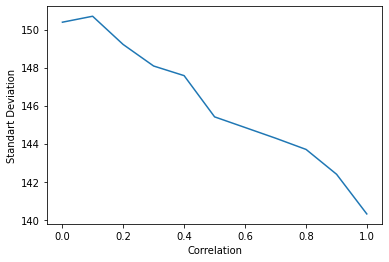

In [161]:
plt.plot(r,std_npv_gaus)
plt.xlabel("Correlation")
plt.ylabel("Standart Deviation")

Text(0, 0.5, 'Standart Deviation')

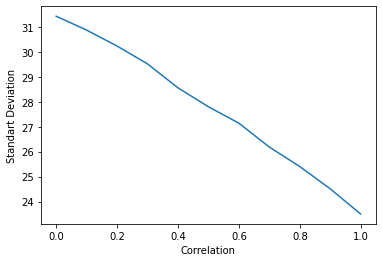

In [162]:
plt.plot(r,std_rev_gaus)
plt.xlabel("Correlation")
plt.ylabel("Standart Deviation")

# Analysis of NPV for different Degrees of freedom Students Copula

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy_financial\_financial.py:780: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.asarray(values)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(
C:\Users\User\AppData\Local\Programs\Python\Pyt

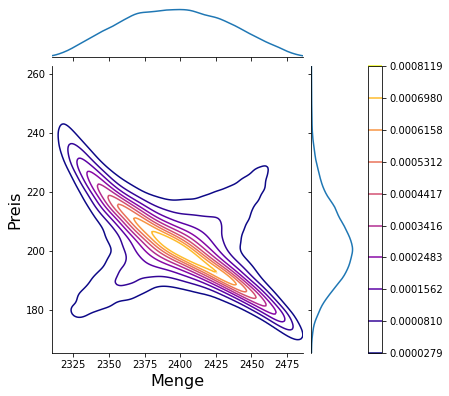

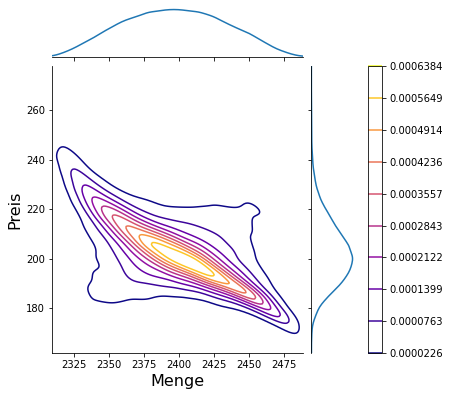

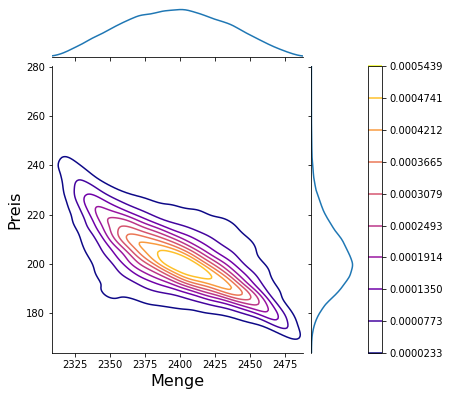

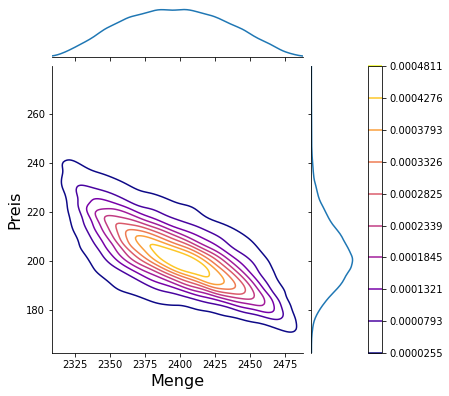

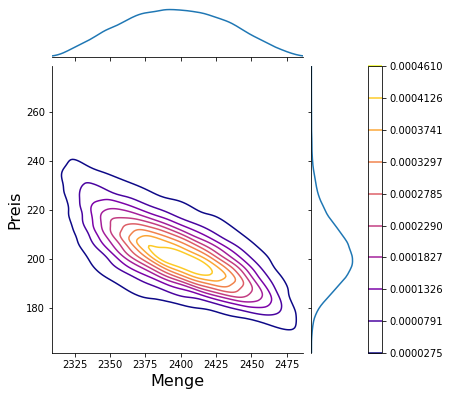

...

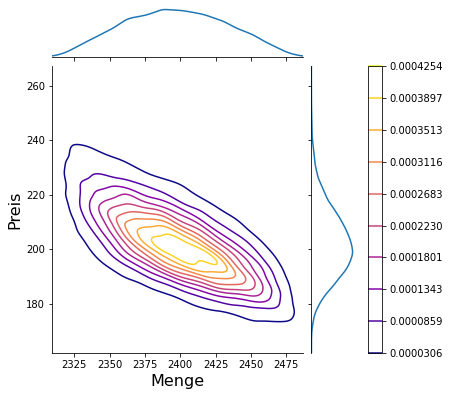

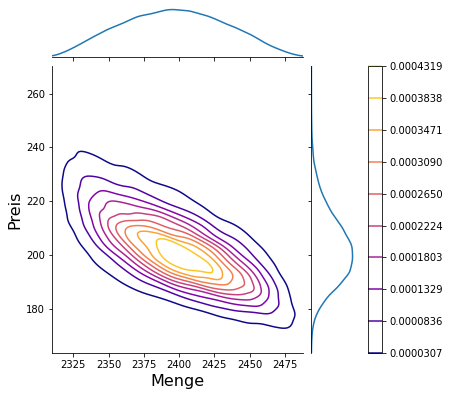

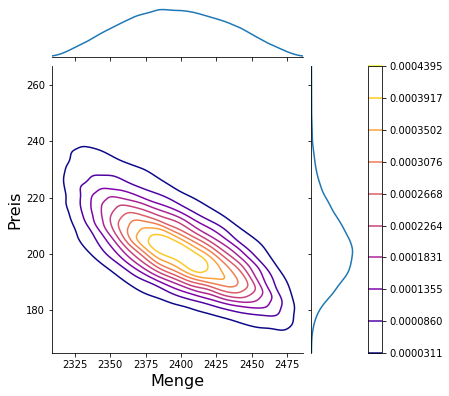

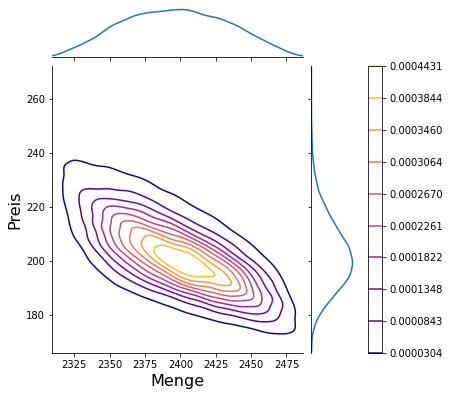

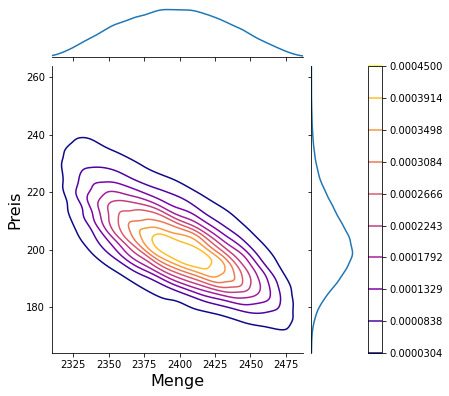

In [102]:
dof=[0.5,1,2,4,6,8,10,12,15,20,25,30,35,40,45,50,55,60,65] # Anzahl der Freiheitsgrade
# Blätter zur Speicherung der Ergebnisse von Durchschnittswerten und Standardabweichungen
mean_npv_stud=[]
std_npv_stud=[]
mean_rev_stud=[]
std_rev_stud=[]
confi_npv_stud=[]
r=-0.7 # Korrelationskoeffizent
# Zyklus 
for i in dof:
    c_target = np.array(    [[  1.0, r],
                        [  r,  1.0, ]]) # Covarienzmatrix
    t_multi=stats.multivariate_t(loc=[0,0], shape=c_target, df=i) # Erstellen einer Klasse gemeinsamer Student's mit einer bestimmten Kovarianzmatrixund DoF
    X_t=t_multi.rvs(N) # Probenahme
    U = t.cdf(X_t,i) # Umwandlung von t-Verteilung in Gleichverteilungen mittels der Comulative Distribution Function
    u_menge=stats.beta(*menge_param).ppf(U[:, 0]) # Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion
    u_preis=stats.pearson3(*preis_param).ppf(U[:, 1]) # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion
    # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = u_menge                           # menge
    preis = u_preis                          # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      #Umsatz
    R=Rev-costs                           #Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    cop(u_menge, u_preis, 'Menge', 'Preis')
    mean_npv_stud.append(np.mean(discount_cashflow))
    std_npv_stud.append(np.std(discount_cashflow))
    mean_rev_stud.append(np.mean(Rev))
    std_rev_stud.append(np.std(Rev))
    confi_npv_stud.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))

# Analysis of NPV for different correlations Student's Copula

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy_financial\_financial.py:780: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.asarray(values)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(
C:\Users\User\AppData\Local\Programs\Python\Pyt

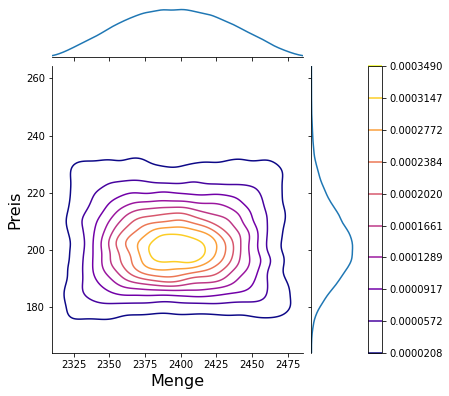

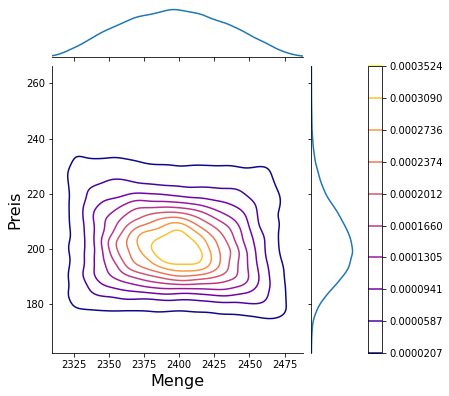

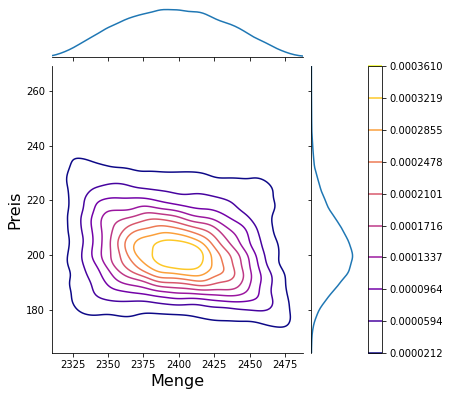

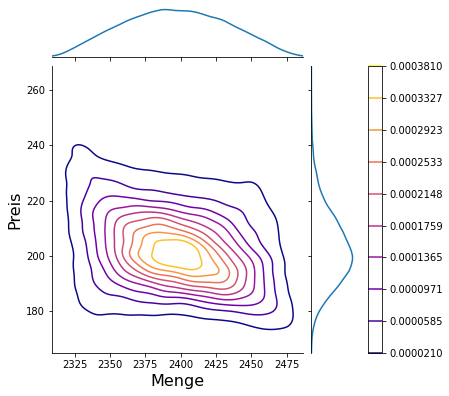

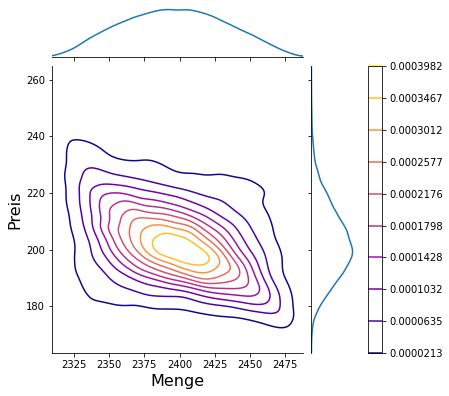

...

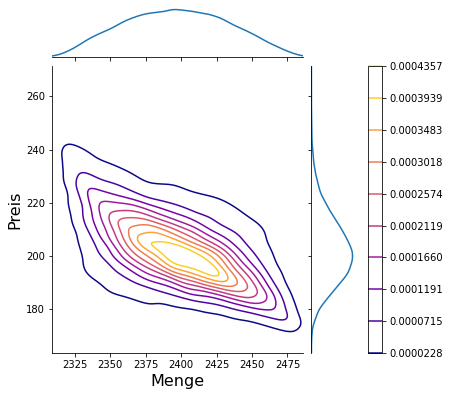

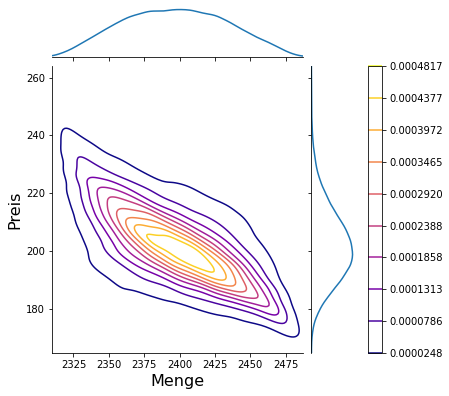

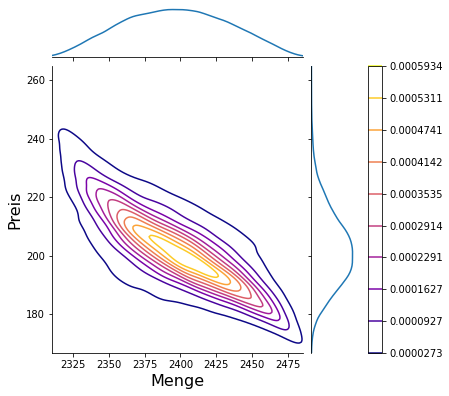

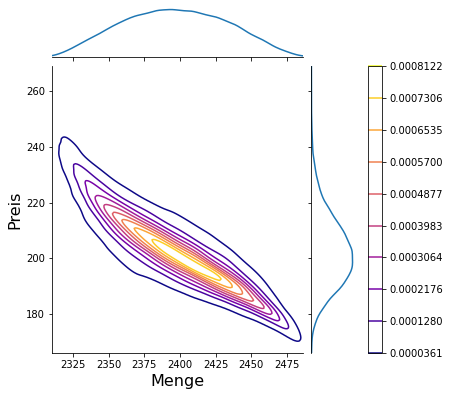

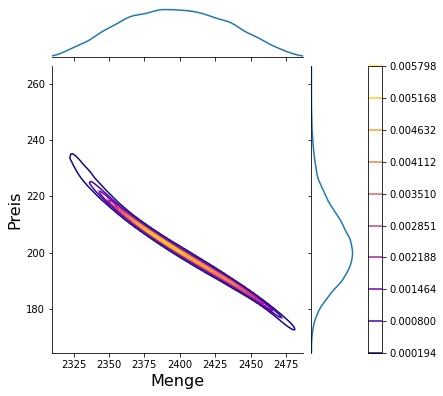

In [111]:
dof=3 # Freiheitsgrad
r=[0.001,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.999] # Korrelationskoeffizent
# Blätter zur Speicherung der Ergebnisse von Durchschnittswerten und Standardabweichungen
mean_npv_stud=[]
std_npv_stud=[]
mean_rev_stud=[]
std_rev_stud=[]
confi_npv_stud=[]
# Zyklus 
for i in r:
    c_target = np.array(    [[  1.0, -i],
                        [  -i,  1.0, ]]) # Covarienzmatrix
    t_multi=stats.multivariate_t(loc=[0,0], shape=c_target, df=dof) # Erstellen einer Klasse gemeinsamer Student's mit einer bestimmten Kovarianzmatrixund DoF
    X_t=t_multi.rvs(N) # Probenahme
    U = t.cdf(X_t,dof) # Umwandlung von t-Verteilung in Gleichverteilungen mittels der Comulative Distribution Function
    u_menge=stats.beta(*menge_param).ppf(U[:, 0]) # Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion
    u_preis=stats.pearson3(*preis_param).ppf(U[:, 1]) # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion
    # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = u_menge                           # menge
    preis = u_preis                          # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      #Umsatz
    R=Rev-costs                           #Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    cop(u_menge, u_preis, 'Menge', 'Preis')
    mean_npv_stud.append(np.mean(discount_cashflow))
    std_npv_stud.append(np.std(discount_cashflow))
    mean_rev_stud.append(np.mean(Rev))
    std_rev_stud.append(np.std(Rev))
    confi_npv_stud.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))

In [112]:
confi_npv_stud # Veränderung des Konfidenzintervalls

[array([-118.72303809,  480.361965  ]),
 array([-115.13972756,  476.66978188]),
 array([-113.20623475,  471.68854322]),
 array([-111.7270536 ,  469.58214835]),
 array([-108.78252437,  466.34174635]),
 array([-110.15506116,  461.10417291]),
 array([-111.70839403,  460.59454637]),
 array([-110.2287518 ,  455.19344207]),
 array([-109.53723399,  453.57840489]),
 array([-108.15147935,  451.77176917]),
 array([-106.31221769,  449.22116665])]

Text(0, 0.5, 'Average')

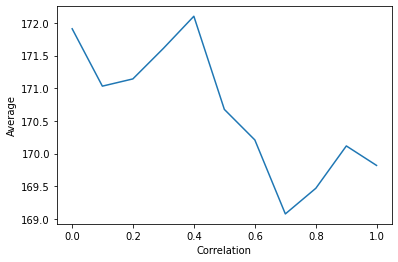

In [113]:
plt.plot(r,mean_npv_stud)
plt.xlabel("Correlation")
plt.ylabel("Average")

Text(0, 0.5, 'Standart Deviation')

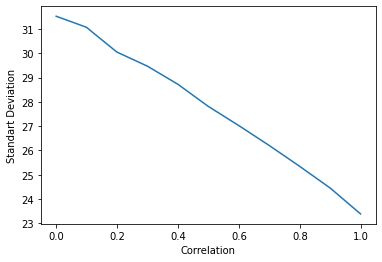

In [116]:
plt.plot(r,std_rev_stud)
plt.xlabel("Correlation")
plt.ylabel("Standart Deviation")

# Copulas with Bibliothek

In [118]:
from pycop import archimedean
from pycop import simulation

# Clayton Copula

In [119]:
n = 2 # dimension

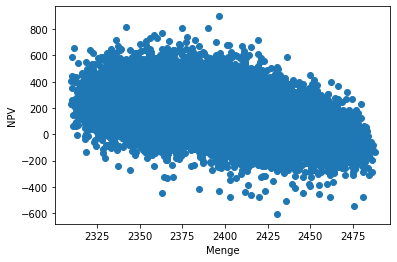

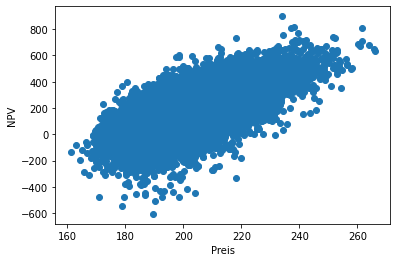

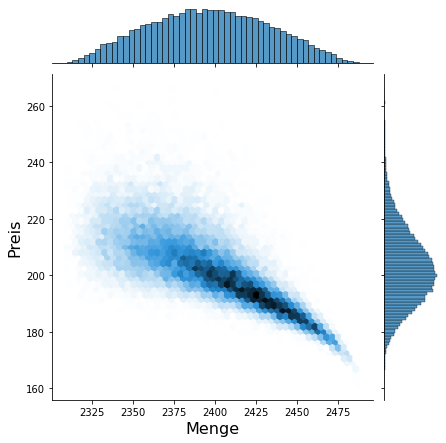

,0
count,30000.000000
mean,168.327280
std,140.710510
min,-607.733352
25%,75.969738
50%,167.671654
75%,259.252412
max,854.769549


In [127]:
    mean_npv=[]
    mean_rev=[]
    std_npv=[]
    std_rev=[]
    tau=0.6 # Kendall's tau
    theta=2*tau/(1-tau) # Copula's Parameter
    u1, u2 = simulation.simu_archimedean("clayton", n, N, theta=theta) # Stichproben aus einer Сopula
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1) # Transformation der Gleichverteilung nach Beta unter Verwendung der Prozentpunktfunktion
    g_preis=stats.pearson3(*preis_param).ppf(u2) # Transformation der Gleichverteilung nach Pearson Typ 3 unter Verwendung der Prozentpunktfunktion
    # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_stud.append(np.mean(discount_cashflow))
    std_npv_stud.append(np.std(discount_cashflow))
    mean_rev_stud.append(np.mean(Rev))
    std_rev_stud.append(np.std(Rev))
    confi_npv_stud.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    plt.scatter(menge,discount_cashflow)
    plt.xlabel("Menge")
    plt.ylabel("NPV")
    plt.show()
    plt.scatter(preis,discount_cashflow)
    plt.xlabel("Preis")
    plt.ylabel("NPV")
    plt.show()
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16);
    plt.show()
    discount_cashflow_df.describe()

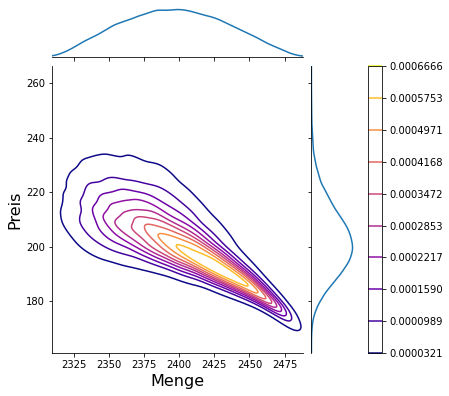

In [130]:
cop(g_menge,g_preis,"Menge","Preis")

In [128]:
np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)])

array([-109.26417939,  462.43124471])

In [129]:
np.percentile(Rev,[100*(1-conf)/2,100*(1-(1-conf)/2)])

array([442.40008186, 543.19454149])

# Analysis of NPV for different correlations Clayton's Copula

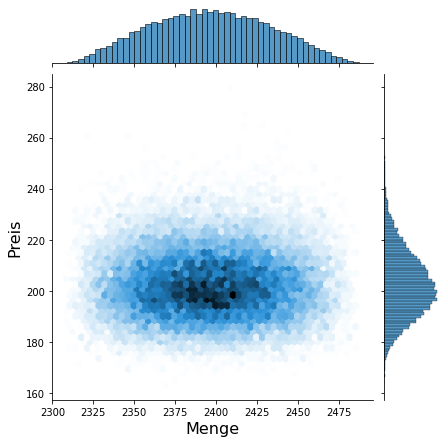

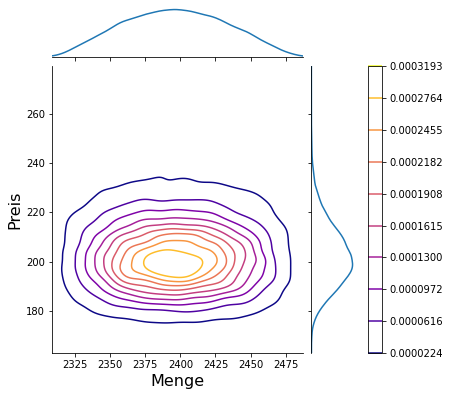

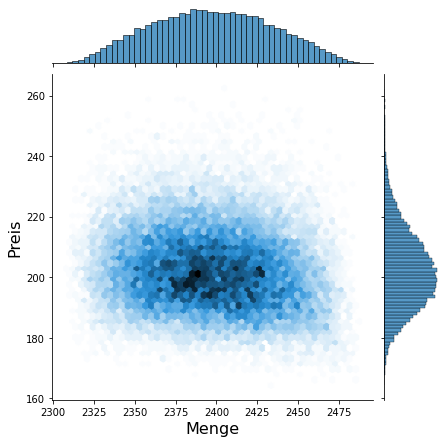

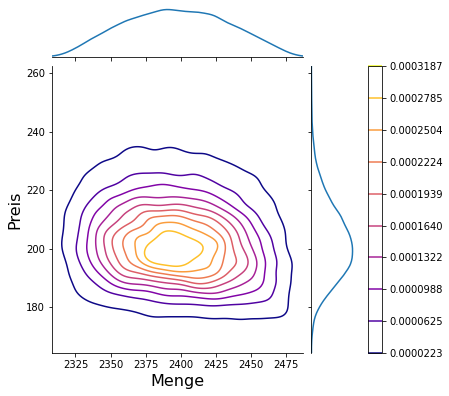

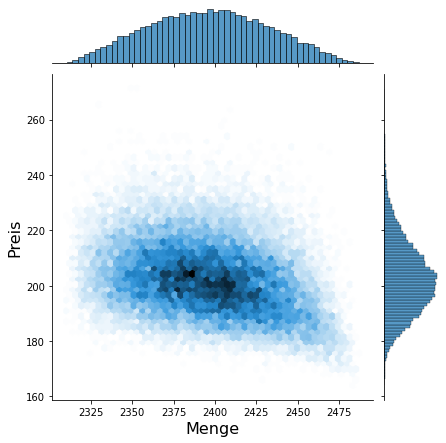

...

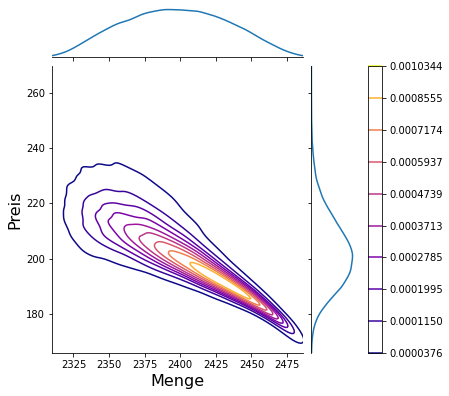

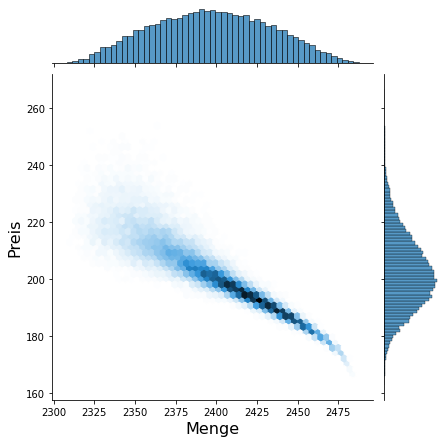

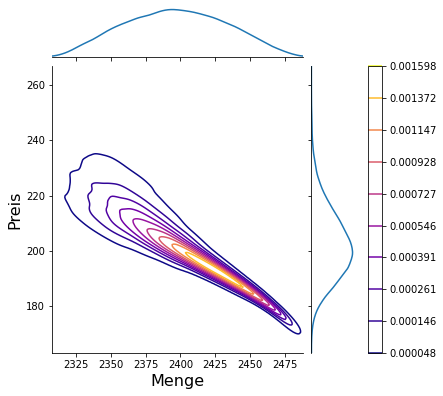

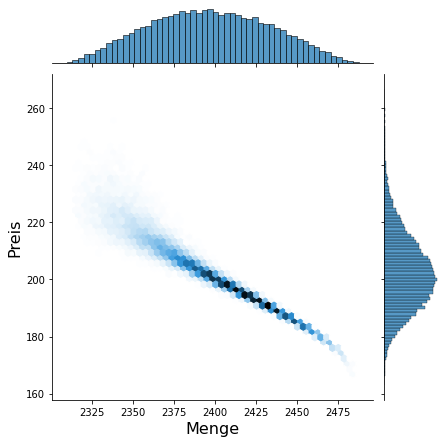

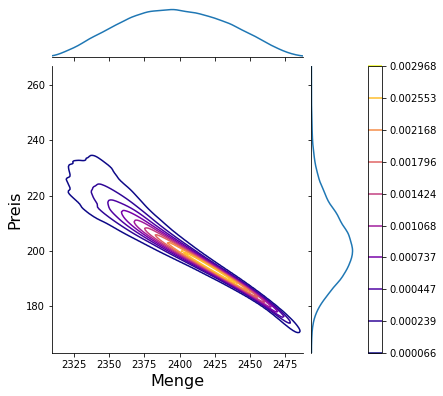

In [139]:
mean_npv_clayton=[]
mean_rev_clayton=[]
std_npv_clayton=[]
std_rev_clayton=[]
confi_npv_clayton=[]
tau_list=[0.001,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for tau in tau_list:
    theta=2*tau/(1-tau)
    u1, u2 = simulation.simu_archimedean("clayton", n, N, theta=theta) # Stichproben aus einer Сopula
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1)
    g_preis=stats.pearson3(*preis_param).ppf(u2)
     # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_clayton.append(np.mean(discount_cashflow))
    std_npv_clayton.append(np.std(discount_cashflow))
    mean_rev_clayton.append(np.mean(Rev))
    std_rev_clayton.append(np.std(Rev))
    confi_npv_clayton.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16)
    plt.show()
    discount_cashflow_df.describe()
    cop(g_menge,g_preis,"Menge","Preis")

Text(0, 0.5, 'Mean')

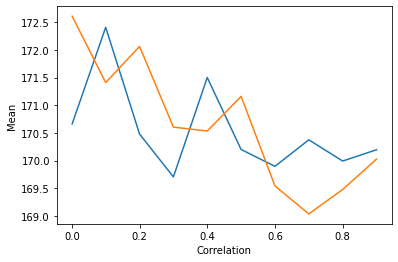

In [140]:
plt.plot(tau_list,mean_npv_gaus[:10])
plt.plot(tau_list,mean_npv_clayton[:10])
plt.xlabel("Correlation")
plt.ylabel("Mean")

Text(0, 0.5, 'Standard Deviation')

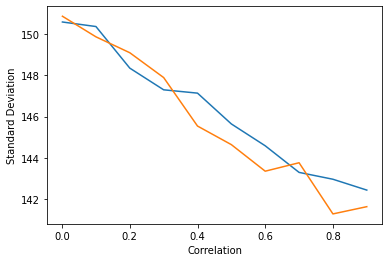

In [141]:
plt.plot(tau_list,std_npv_gaus[:10])
plt.plot(tau_list,std_npv_clayton)
plt.xlabel("Correlation")
plt.ylabel("Standard Deviation")

# Frank Copula

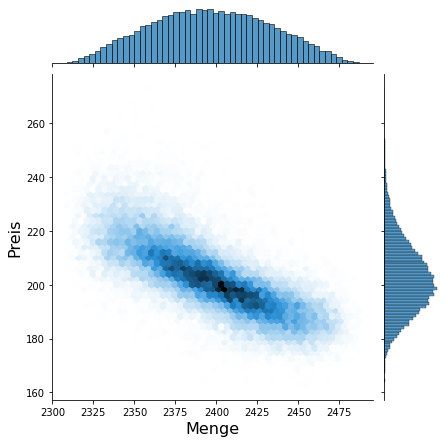

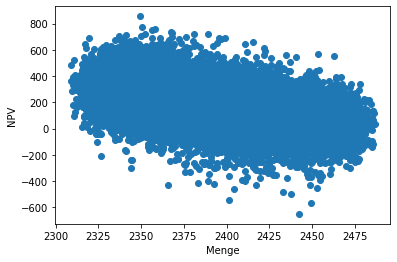

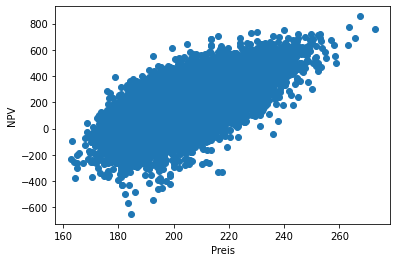

,0
count,30000.000000
mean,168.327280
std,140.710510
min,-607.733352
25%,75.969738
50%,167.671654
75%,259.252412
max,854.769549


In [148]:
    mean_npv=[]
    mean_rev=[]
    std_npv=[]
    std_rev=[]
    theta=7.929  # Copula's Parameter
    u1, u2 = simulation.simu_archimedean("frank", n, N, theta=theta) # Stichproben aus einer Сopula
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1) 
    g_preis=stats.pearson3(*preis_param).ppf(u2)
     # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_stud.append(np.mean(discount_cashflow))
    std_npv_stud.append(np.std(discount_cashflow))
    mean_rev_stud.append(np.mean(Rev))
    std_rev_stud.append(np.std(Rev))
    confi_npv_stud.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    plt.show()
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16);
    plt.show()
    discount_cashflow_df.describe()
    plt.scatter(menge,discount_cashflow)
    plt.xlabel("Menge")
    plt.ylabel("NPV")
    plt.show()
    plt.scatter(preis,discount_cashflow)
    plt.xlabel("Preis")
    plt.ylabel("NPV")
    plt.show()
    discount_cashflow_df.describe()

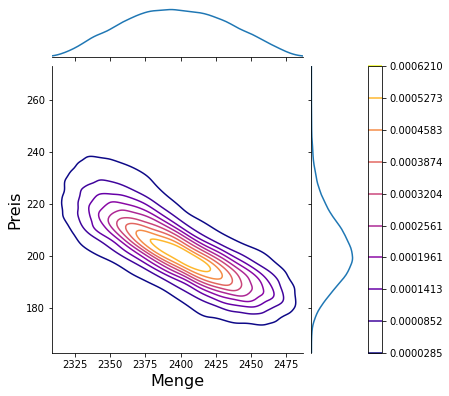

In [149]:
cop(g_menge,g_preis , 'Menge', 'Preis')

# Analysis of NPV for different correlations Frank's Copula

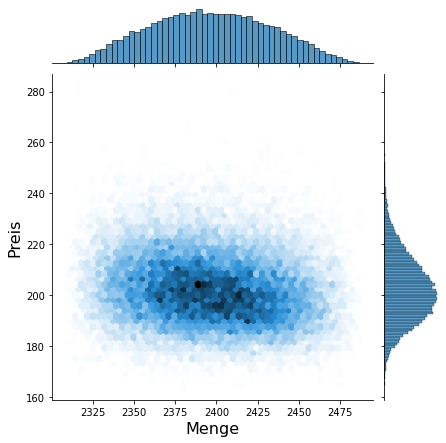

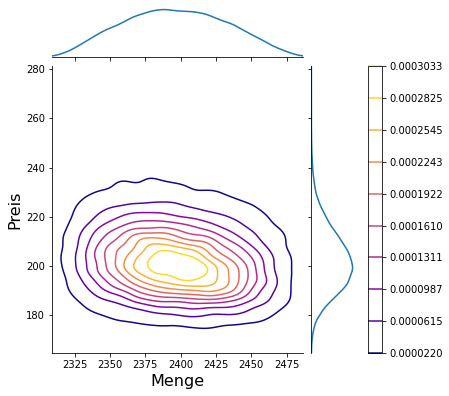

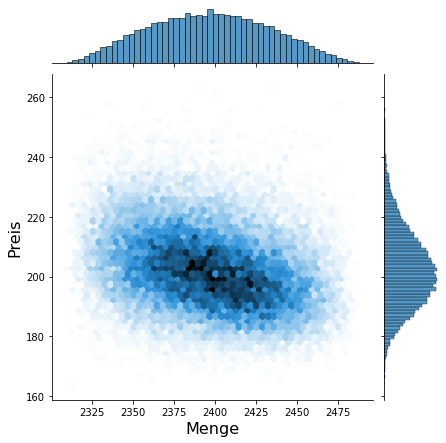

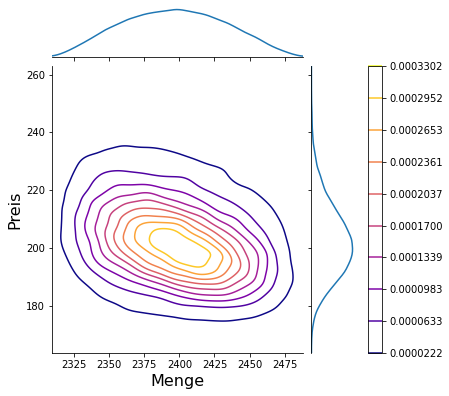

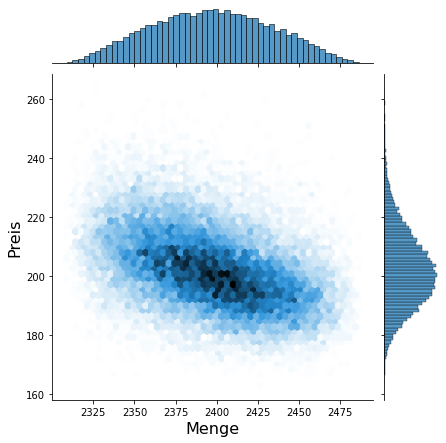

...

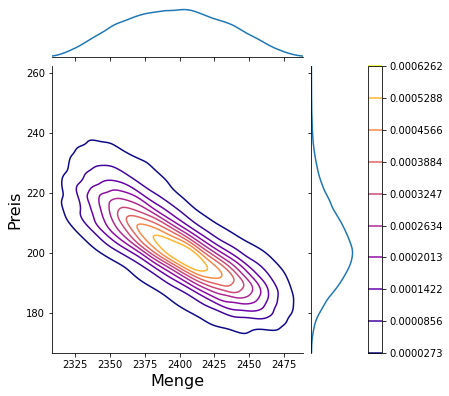

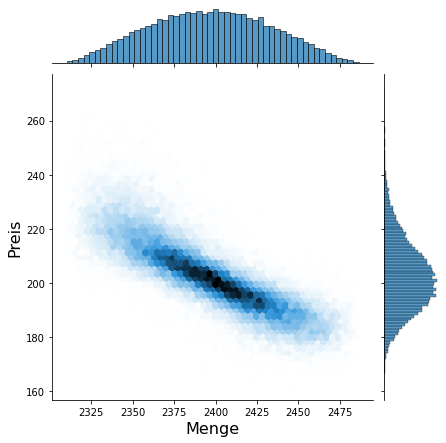

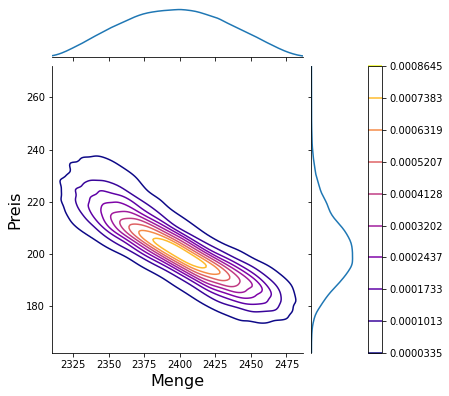

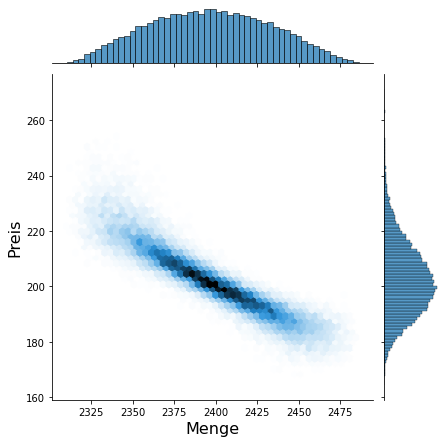

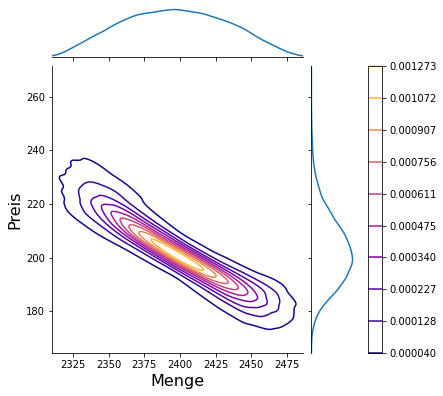

In [146]:
mean_npv_frank=[]
mean_rev_frank=[]
std_npv_frank=[]
std_rev_frank=[]
confi_npv_frank=[]
theta_list=[0.907,1.860,2.917,4.161,5.736,7.929,11.411,18.191]
for thet in theta_list:
    u1, u2 = simulation.simu_archimedean("frank", n, N, theta=thet)
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1)
    g_preis=stats.pearson3(*preis_param).ppf(u2)
     # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_frank.append(np.mean(discount_cashflow))
    std_npv_frank.append(np.std(discount_cashflow))
    mean_rev_frank.append(np.mean(Rev))
    std_rev_frank.append(np.std(Rev))
    confi_npv_frank.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16)
    plt.show()
    discount_cashflow_df.describe()
    cop(g_menge,g_preis,"Menge","Preis")

# Joe Copula

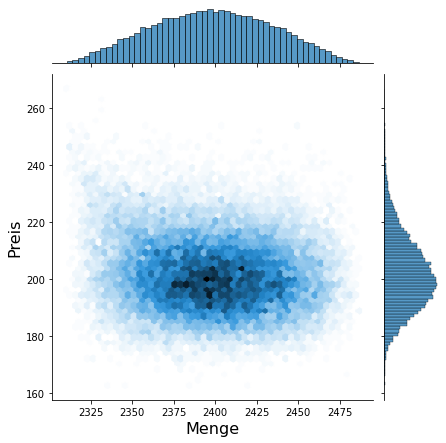

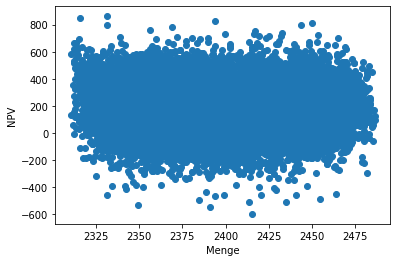

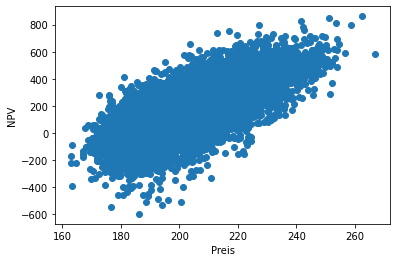

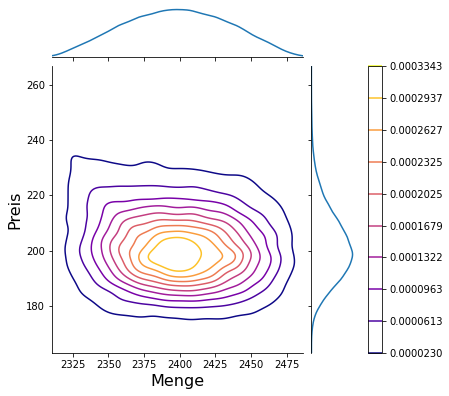

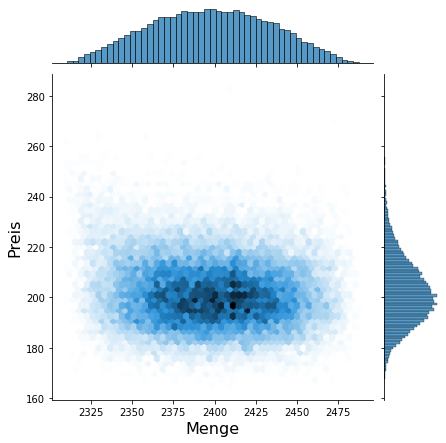

...

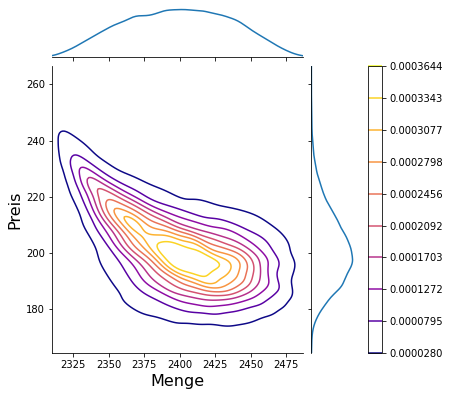

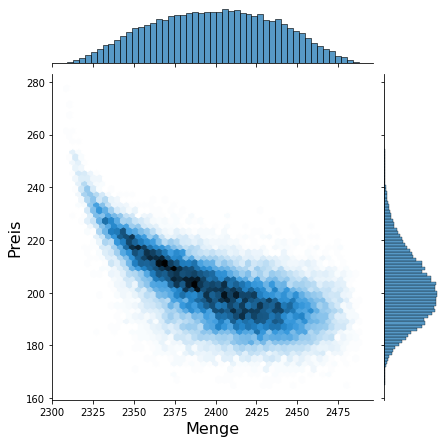

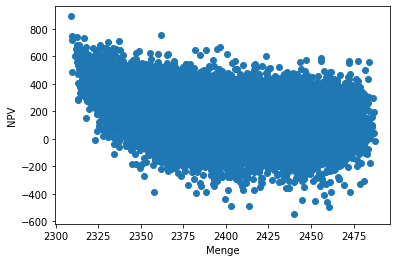

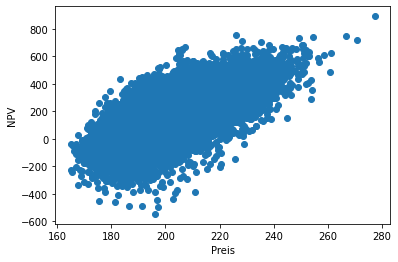

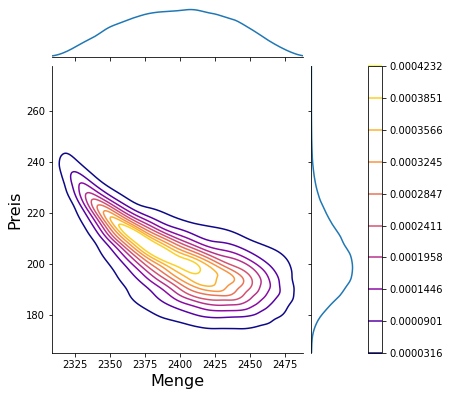

In [163]:
mean_npv_joe=[]
mean_rev_joe=[]
std_npv_joe=[]
std_rev_joe=[]
mode_npv_joe=[]
confi_npv_joe=[]
theta_list=[1.194,1.144,1.772,2.219,2.856]
for thet in theta_list:
    u1, u2 = simulation.simu_archimedean("joe", n, N, theta=thet)
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1)
    g_preis=stats.pearson3(*preis_param).ppf(u2)
     # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_joe.append(np.mean(discount_cashflow))
    std_npv_joe.append(np.std(discount_cashflow))
    mean_rev_joe.append(np.mean(Rev))
    std_rev_joe.append(np.std(Rev))
    confi_npv_joe.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16)
    plt.show()
    discount_cashflow_df.describe()
    plt.scatter(menge,discount_cashflow)
    plt.xlabel("Menge")
    plt.ylabel("NPV")
    plt.show()
    plt.scatter(preis,discount_cashflow)
    plt.xlabel("Preis")
    plt.ylabel("NPV")
    plt.show()
    cop(g_menge,g_preis,"Menge","Preis")

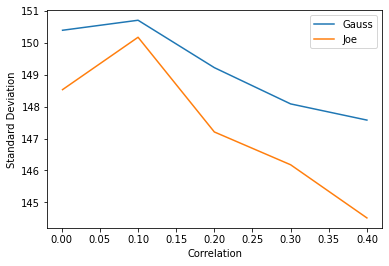

In [164]:
plt.plot(tau_list[:5],std_npv_gaus[:5],label="Gauss")
plt.plot(tau_list[:5],std_npv_joe[:5],label="Joe")
plt.xlabel("Correlation")
plt.ylabel("Standard Deviation")
plt.legend()

# Combined Copula 

# Frank-Joe

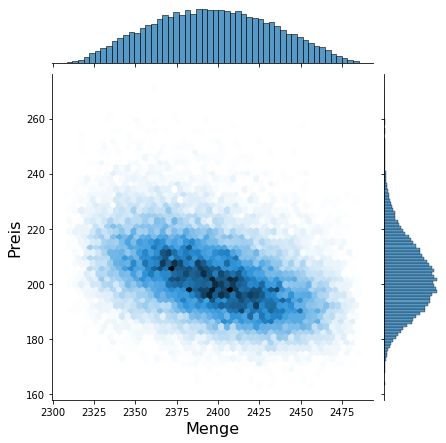

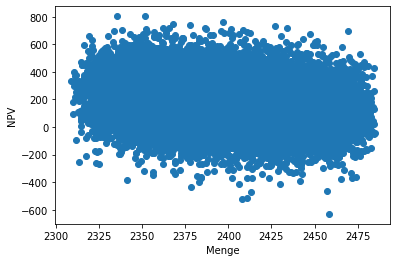

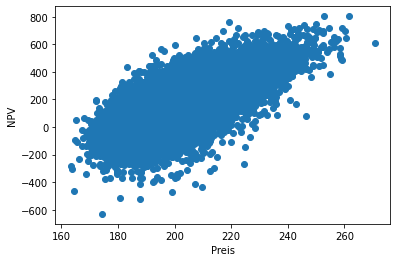

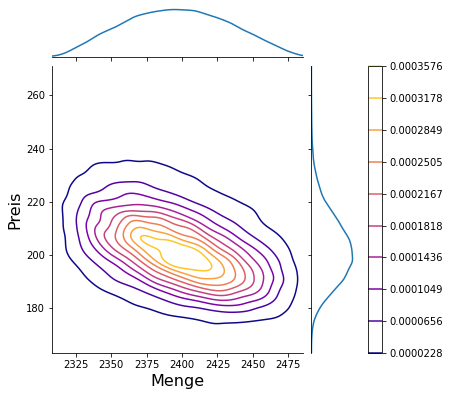

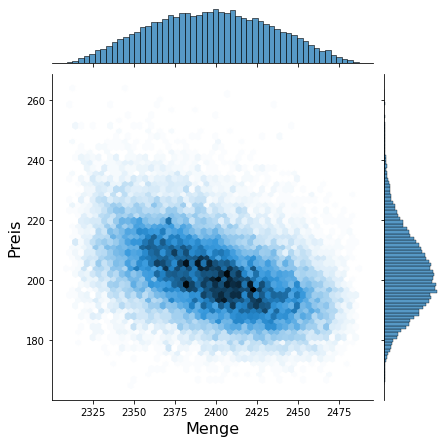

...

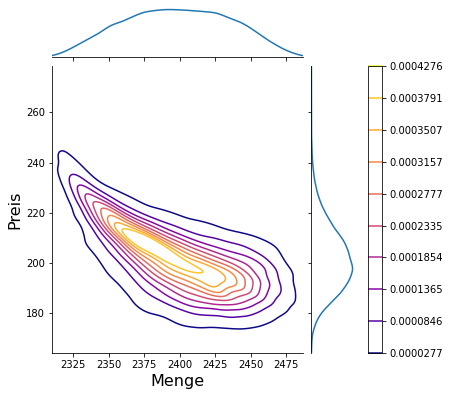

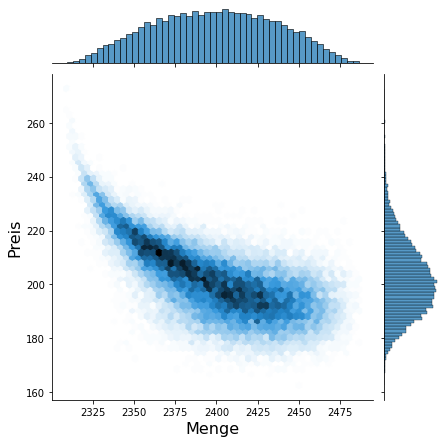

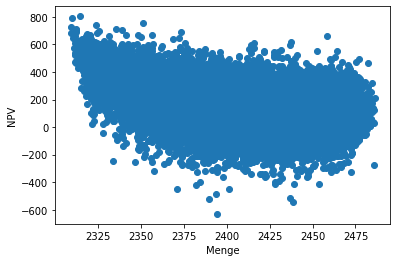

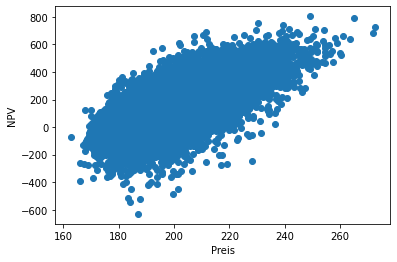

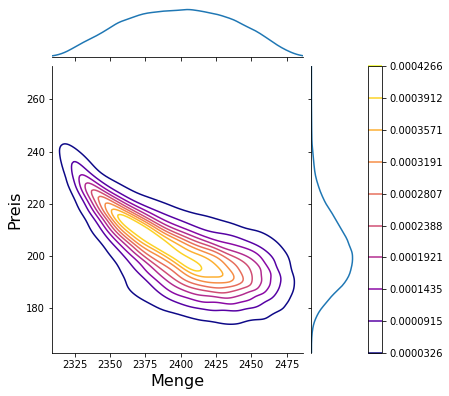

In [169]:
weight_list=[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
mean_npv_comb=[]
std_npv_comb=[]
mean_rev_comb=[]
std_rev_comb=[]
confi_npv_comb=[]
tetta_joe=2.856
tetta_frank=2.917
for i in weight_list:
    combination = [
    {"type": "joe", "weight": i, "theta": tetta_joe},
    {"type": "frank", "weight": 1-i, "theta": tetta_frank}
    ]
    u1, u2 = simulation.simu_mixture(n, N, combination)
    u1 = 1 - u1 # Unter Berücksichtigung der negativen Korrelation
    g_menge=stats.beta(*menge_param).ppf(u1)
    g_preis=stats.pearson3(*preis_param).ppf(u2)
     # Monte Carlo Simulation
    I=-500              #Investition
    rate=0.12            # Discount rate
    years=5             # Projektlaufzeit
    menge = g_menge                           # menge
    preis=g_preis                            # preis
    var=rand_var_costs/1000                   # variable Kosten
    fix=rand_const_costs/1000            # fixe Kosten
    costs=var*menge+fix                 # gemeinsame Kosten
    Rev = menge * preis/1000                      # Umsatz
    R=Rev-costs                           # Cash Flow
    discount_cashflow=npf.npv(rate,[I,R,R,R,R,R])   # NPV
    mean_npv_comb.append(np.mean(discount_cashflow))
    std_npv_comb.append(np.std(discount_cashflow))
    mean_rev_comb.append(np.mean(Rev))
    std_rev_comb.append(np.std(Rev))
    confi_npv_comb.append(np.percentile(discount_cashflow,[100*(1-conf)/2,100*(1-(1-conf)/2)]))
    h = sns.jointplot(g_menge, g_preis, kind='hex')
    h.set_axis_labels('Menge', 'Preis', fontsize=16)
    plt.show()
    discount_cashflow_df.describe()
    plt.scatter(menge,discount_cashflow)
    plt.xlabel("Menge")
    plt.ylabel("NPV")
    plt.show()
    plt.scatter(preis,discount_cashflow)
    plt.xlabel("Preis")
    plt.ylabel("NPV")
    plt.show()
    cop(g_menge,g_preis,"Menge","Preis")

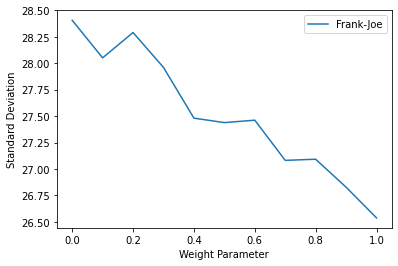

In [172]:
plt.plot(weight_list[:11],std_rev_comb[:11],label="Frank-Joe")
plt.xlabel("Weight Parameter")
plt.ylabel("Standard Deviation")
plt.legend()

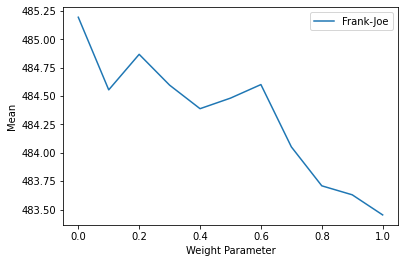

In [173]:
plt.plot(weight_list[:11],mean_rev_comb[:11],label="Frank-Joe")
plt.xlabel("Weight Parameter")
plt.ylabel("Mean")
plt.legend()